In [1]:
import numpy as np
import math
import scipy
import matplotlib.pyplot as plt
from ast import literal_eval
import re
import pandas as pd

## load dataset

spiral

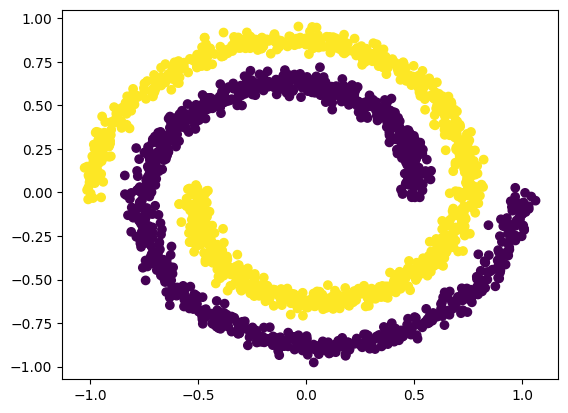

In [2]:
def data_generator():
    n = 1000
    t = np.linspace(0, 2*np.pi, n)
    r = np.linspace(0.5, 1, n)
    x1 = r * np.cos(t) + np.random.randn(n) * 0.033
    y1 = r * np.sin(t) + np.random.randn(n) * 0.033
    x2 = -r * np.cos(t) + np.random.randn(n) * 0.033
    y2 = -r * np.sin(t) + np.random.randn(n) * 0.033
    X = np.vstack((np.hstack((x1, x2)), np.hstack((y1, y2)))).T
    y = np.hstack((np.zeros(n), np.ones(n)))
    return X,y

spiral_x , spiral_y = data_generator()
plt.scatter(spiral_x[:,0], spiral_x[:,1], c = spiral_y)
plt.show()

ecoli

In [2]:
data_ecoli = []
labels_data_ecoli = []
with open('D:/AmirKabir/term 4/big data/final_project/ecoli.data', 'r') as file:
    for line in file:
        line = line.strip()
        if line:
            values = line.split()
            data_ecoli.append([float(value) for value in values[1:-1]])
            labels_data_ecoli.append(values[-1])

lithuanian

In [3]:
# read dataset
matlab_file = scipy.io.loadmat('lithuanian.mat')
#visualize data
# plt.scatter(data[:,0],data[:,1],c=labels)
# plt.show()
# data.shape

In [3]:
# matlab_file['data'] 
# data_ecoli
# labels = matlab_file['label']
# labels = labels.squeeze()
#**********************************************
#label_mapping = {'cp': 0, 'im': 1, 'pp': 2, 'imU': 3, 'om': 4, 'omL': 5, 'imL': 6, 'imS': 7}
#labels = [label_mapping[label] if label in label_mapping else label for label in labels_data_ecoli]
#labels = np.array(labels)
#labels = labels.squeeze()
input_data = spiral_x
labels = np.array(spiral_y)
labels = labels.squeeze()

In [4]:
input_data = np.array(input_data)
labels = np.array(labels)
labels = labels.squeeze()

In [5]:
data = np.array(input_data)
diff = data[:, np.newaxis, :] - data[np.newaxis, :, :]
distance = np.linalg.norm(diff, axis=2)
d_matrix = pd.DataFrame(distance)
d_matrix

,0,1,2,3,4,5,6,7,8,9,...,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999
0,0.000000,0.007172,0.081921,0.115857,0.022743,0.044478,0.083689,0.092492,0.025269,0.135431,...,1.535910,1.486390,1.500950,1.476044,1.532266,1.507413,1.524466,1.541530,1.513575,1.518134
1,0.007172,0.000000,0.077555,0.108782,0.020659,0.038990,0.078901,0.085457,0.020168,0.128642,...,1.532527,1.482716,1.497353,1.472903,1.528767,1.503927,1.521231,1.538214,1.510450,1.514636
2,0.081921,0.077555,0.000000,0.102660,0.060073,0.040034,0.006342,0.060024,0.057428,0.130515,...,1.455654,1.405441,1.420169,1.396491,1.451713,1.426893,1.444625,1.461456,1.434071,1.437584
3,0.115857,0.108782,0.102660,0.000000,0.111503,0.090898,0.097063,0.042814,0.100627,0.028017,...,1.501994,1.447424,1.463323,1.446550,1.496298,1.471739,1.493183,1.508779,1.484263,1.482220
4,0.022743,0.020659,0.060073,0.111503,0.000000,0.026392,0.062449,0.081025,0.010924,0.134392,...,1.513189,1.463741,1.478277,1.453301,1.509568,1.484712,1.501729,1.518800,1.490832,1.495436
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,1.507413,1.503927,1.426893,1.471739,1.484712,1.466827,1.426558,1.449693,1.484046,1.487846,...,0.037909,0.049815,0.027427,0.086763,0.025046,0.000000,0.062399,0.053402,0.086007,0.011098
1996,1.524466,1.521231,1.444625,1.493183,1.501729,1.484641,1.444554,1.469687,1.501501,1.510176,...,0.037251,0.111695,0.089825,0.053170,0.064111,0.062399,0.000000,0.025827,0.028310,0.063434
1997,1.541530,1.538214,1.461456,1.508779,1.518800,1.501453,1.461300,1.485775,1.518432,1.525465,...,0.017136,0.102543,0.079141,0.077347,0.045509,0.053402,0.025827,0.000000,0.053482,0.049944
1998,1.513575,1.510450,1.434071,1.484263,1.490832,1.474102,1.434116,1.460123,1.490796,1.501654,...,0.065476,0.133215,0.113005,0.037726,0.091526,0.086007,0.028310,0.053482,0.000000,0.089077


In [6]:
def find_dc(data):
    data = np.array(data)
    diff = data[:, np.newaxis, :] - data[np.newaxis, :, :]
    distance = np.linalg.norm(diff, axis=2)
    d_matrix = pd.DataFrame(distance)

    for i, row in  d_matrix.iterrows():
        for j, column in row.iteritems():
            if column == 0:
                d_matrix.at[i,j] = np.inf
    dc = np.max(d_matrix.min())
    return dc
dc = find_dc(data)
dc

C:\Users\moham\AppData\Local\Temp\ipykernel_10840\2156294850.py:8: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for j, column in row.iteritems():


0.07388514630746729

In [7]:
mask = d_matrix <= dc
mask_d_matrix = d_matrix.where(mask, 0)
mask_d_matrix

,0,1,2,3,4,5,6,7,8,9,...,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999
0,0.000000,0.007172,0.000000,0.0,0.022743,0.044478,0.000000,0.000000,0.025269,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.007172,0.000000,0.000000,0.0,0.020659,0.038990,0.000000,0.000000,0.020168,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.000000,0.000000,0.0,0.060073,0.040034,0.006342,0.060024,0.057428,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.042814,0.000000,0.028017,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.022743,0.020659,0.060073,0.0,0.000000,0.026392,0.062449,0.000000,0.010924,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.037909,0.049815,0.027427,0.000000,0.025046,0.000000,0.062399,0.053402,0.000000,0.011098
1996,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.037251,0.000000,0.000000,0.053170,0.064111,0.062399,0.000000,0.025827,0.028310,0.063434
1997,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.017136,0.000000,0.000000,0.000000,0.045509,0.053402,0.025827,0.000000,0.053482,0.049944
1998,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.065476,0.000000,0.000000,0.037726,0.000000,0.000000,0.028310,0.053482,0.000000,0.000000


In [8]:
def find_density(d_matrix, dc):    
    density_list = []
    for i in range(0, len(d_matrix)): 
        temp = 0   
        for data in d_matrix[i]:
            if data != 0 and data < dc:
                T = -((data/dc)**2)
                temp += math.exp(T)
        density_list.append(temp)
    return density_list
density = find_density(mask_d_matrix, dc)
density

[5.439514135720852,
 6.918245532927938,
 7.5411463693593985,
 26.860903750041306,
 7.1191595467005,
 12.129722473526625,
 8.302394719953664,
 20.739324956792046,
 9.976328841006861,
 27.28189465086081,
 20.261627429409604,
 7.8794150839003425,
 23.071522423014944,
 22.53923811193107,
 21.583357520032276,
 14.260187419757413,
 9.92142827637332,
 27.01064420387724,
 24.604117624235514,
 24.184211272982736,
 9.604900962184134,
 26.653956131034505,
 24.653993041350667,
 19.598715944974334,
 25.329798654129608,
 22.142749475058118,
 22.533930031487373,
 26.9803307057013,
 25.226338068704496,
 25.020080445016408,
 11.328675357740943,
 18.015781861759592,
 6.40211651165581,
 24.133828064167982,
 19.817892978454275,
 19.69743836430474,
 19.039638258844192,
 26.956574590054565,
 23.399535939816197,
 20.326657374422968,
 26.65668146712999,
 24.113605664060163,
 23.958013481409285,
 23.054721655800865,
 23.997451897728467,
 24.688255409262286,
 13.218322457427716,
 6.836540255849235,
 20.45522021

In [9]:
#for each point find the point that are has higher density than itself
def find_higher_density(density):
    higher_density = []
    for i in range(0, len(density)):
        temp = []
        for j in range(0, len(density)):
            if density[i] < density[j]:
                temp.append(j)
        higher_density.append(temp)
    return higher_density
higher_density = find_higher_density(density)
higher_density

[[1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37,
  38,
  39,
  40,
  41,
  42,
  43,
  44,
  45,
  46,
  47,
  48,
  49,
  50,
  51,
  52,
  53,
  54,
  55,
  56,
  57,
  58,
  59,
  60,
  61,
  62,
  63,
  64,
  65,
  66,
  67,
  68,
  69,
  70,
  71,
  72,
  73,
  74,
  75,
  76,
  77,
  78,
  79,
  80,
  81,
  82,
  83,
  84,
  85,
  86,
  87,
  88,
  89,
  90,
  91,
  92,
  93,
  94,
  95,
  96,
  97,
  98,
  99,
  100,
  101,
  102,
  103,
  104,
  105,
  106,
  107,
  108,
  109,
  110,
  111,
  112,
  113,
  114,
  115,
  116,
  117,
  118,
  119,
  120,
  121,
  122,
  123,
  124,
  125,
  126,
  127,
  128,
  129,
  130,
  131,
  132,
  133,
  134,
  135,
  136,
  137,
  138,
  139,
  140,
  141,
  142,
  143,
  144,
  145,
  146,
  147,
  148,
  149,
  150,
  151,
  152,
  153,
  155,
  156,
  158,
  159,
  160,
  

In [10]:
def upward_distance(d_matrix , higher_density):    
    upward_distance = []
    for i in range(0,len(d_matrix)):
        if len(higher_density[i])!=0:
            upward_distance.append(np.min(d_matrix[i][higher_density[i]]))
        else:
            upward_distance.append(np.max(d_matrix[i]))
    return upward_distance
upward_distance = upward_distance(d_matrix, higher_density)
upward_distance

[0.0071723907120301205,
 0.020167731534458232,
 0.00634198905103924,
 0.004323971567055055,
 0.010924053252582864,
 0.04571374915140035,
 0.02079946279600524,
 0.008482948324609808,
 0.019231868614427047,
 0.00880178596047644,
 0.011576075688999212,
 0.01776269515700651,
 0.015183436610351564,
 0.010846642273936401,
 0.00946358233761191,
 0.013598512296550331,
 0.03520885564583891,
 0.015745951608732715,
 0.009683582877157836,
 0.016480926143234723,
 0.03681033668349165,
 0.013465276016155681,
 0.0035541698194187545,
 0.015958412184901648,
 0.01211331459307331,
 0.01285538047830643,
 0.009578658940126102,
 0.015599692543764499,
 0.014823138130357842,
 0.008293891348844555,
 0.03316393397529645,
 0.009536819440151379,
 0.020182532649190205,
 0.009048731934001146,
 0.012567702997633538,
 0.0017773721073037303,
 0.022614575144430212,
 0.005213007034148387,
 0.00875682566379185,
 0.021043475609374557,
 0.004259524547965753,
 0.009130042597567185,
 0.01048252877453562,
 0.011259594740995263

RNN

In [11]:
def calcualte_RNN(d_matrix):
  min_dis = [] 
  rnn=[] 
  for i in d_matrix:
    count = 0
    i = [np.inf if j == 0 else j for count, j in enumerate(i)]
    min_dis = np.append(min_dis,int(np.argmin(i)))
  rnn = np.append(rnn, [np.sum(min_dis == i) for i in range(0, len(min_dis))])
  return rnn

RNN = calcualte_RNN(np.array(d_matrix))

In [12]:
RNN

array([1., 1., 1., ..., 2., 2., 2.])

noise selection

In [13]:
density_mean , desnsity_std = np.mean(density) , np.std(density)
upward_distance_mean , upward_distance_std = np.mean(upward_distance) , np.std(upward_distance)
RNN_mean , RNN_std = np.mean(RNN) , np.std(RNN)

In [14]:
density_mean , desnsity_std ,upward_distance_mean ,upward_distance_std,RNN_mean , RNN_std

(15.380887897507899,
 5.058843065971501,
 0.02326103890796692,
 0.05138829507176304,
 1.0,
 0.7893034904268447)

In [15]:
T_density = density_mean - desnsity_std
T_upward = upward_distance_mean + upward_distance_std
T_RNN = RNN_mean - RNN_std

list of noise

In [16]:
list_of_noise = []
for i in range(0, len(d_matrix)):
    if density[i] < T_density and upward_distance[i] > T_upward and RNN[i] < T_RNN:
        list_of_noise.append(i)
list_of_noise

[]

remove noise from data and all three list

In [17]:
#remove noise frome data:
noise_free_density = np.delete(density, list_of_noise)
noise_free_upward_distance = np.delete(upward_distance, list_of_noise)
noise_free_RNN = np.delete(RNN, list_of_noise)
noise_free_data = np.delete(data, list_of_noise , axis=0)
labels_free = np.delete(labels, list_of_noise)

In [18]:
labels_free = np.delete(labels, list_of_noise)
labels_free.shape

(2000,)

In [19]:
noise_free_data = np.array(noise_free_data)
diff_new = noise_free_data[:, np.newaxis, :] - noise_free_data[np.newaxis, :, :]
distance_new = np.linalg.norm(diff_new, axis=2)
d_matrix_denoise = pd.DataFrame(distance_new)
d_matrix_denoise

,0,1,2,3,4,5,6,7,8,9,...,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999
0,0.000000,0.007172,0.081921,0.115857,0.022743,0.044478,0.083689,0.092492,0.025269,0.135431,...,1.535910,1.486390,1.500950,1.476044,1.532266,1.507413,1.524466,1.541530,1.513575,1.518134
1,0.007172,0.000000,0.077555,0.108782,0.020659,0.038990,0.078901,0.085457,0.020168,0.128642,...,1.532527,1.482716,1.497353,1.472903,1.528767,1.503927,1.521231,1.538214,1.510450,1.514636
2,0.081921,0.077555,0.000000,0.102660,0.060073,0.040034,0.006342,0.060024,0.057428,0.130515,...,1.455654,1.405441,1.420169,1.396491,1.451713,1.426893,1.444625,1.461456,1.434071,1.437584
3,0.115857,0.108782,0.102660,0.000000,0.111503,0.090898,0.097063,0.042814,0.100627,0.028017,...,1.501994,1.447424,1.463323,1.446550,1.496298,1.471739,1.493183,1.508779,1.484263,1.482220
4,0.022743,0.020659,0.060073,0.111503,0.000000,0.026392,0.062449,0.081025,0.010924,0.134392,...,1.513189,1.463741,1.478277,1.453301,1.509568,1.484712,1.501729,1.518800,1.490832,1.495436
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,1.507413,1.503927,1.426893,1.471739,1.484712,1.466827,1.426558,1.449693,1.484046,1.487846,...,0.037909,0.049815,0.027427,0.086763,0.025046,0.000000,0.062399,0.053402,0.086007,0.011098
1996,1.524466,1.521231,1.444625,1.493183,1.501729,1.484641,1.444554,1.469687,1.501501,1.510176,...,0.037251,0.111695,0.089825,0.053170,0.064111,0.062399,0.000000,0.025827,0.028310,0.063434
1997,1.541530,1.538214,1.461456,1.508779,1.518800,1.501453,1.461300,1.485775,1.518432,1.525465,...,0.017136,0.102543,0.079141,0.077347,0.045509,0.053402,0.025827,0.000000,0.053482,0.049944
1998,1.513575,1.510450,1.434071,1.484263,1.490832,1.474102,1.434116,1.460123,1.490796,1.501654,...,0.065476,0.133215,0.113005,0.037726,0.091526,0.086007,0.028310,0.053482,0.000000,0.089077


center of cluster

In [20]:
center_of_cluster = []
for i in range(0, len(d_matrix_denoise)):
    if  noise_free_upward_distance[i] > T_upward:
        center_of_cluster.append(i)

In [21]:
print(center_of_cluster)

[57, 71, 124, 202, 227, 280, 337, 363, 399, 410, 484, 515, 560, 578, 636, 671, 704, 749, 777, 822, 868, 900, 935, 959, 1039, 1072, 1138, 1202, 1287, 1336, 1371, 1400, 1428, 1468, 1498, 1540, 1571, 1644, 1701, 1714, 1753, 1790, 1831, 1880, 1917, 1960]


In [22]:
d_matrix_denoise

,0,1,2,3,4,5,6,7,8,9,...,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999
0,0.000000,0.007172,0.081921,0.115857,0.022743,0.044478,0.083689,0.092492,0.025269,0.135431,...,1.535910,1.486390,1.500950,1.476044,1.532266,1.507413,1.524466,1.541530,1.513575,1.518134
1,0.007172,0.000000,0.077555,0.108782,0.020659,0.038990,0.078901,0.085457,0.020168,0.128642,...,1.532527,1.482716,1.497353,1.472903,1.528767,1.503927,1.521231,1.538214,1.510450,1.514636
2,0.081921,0.077555,0.000000,0.102660,0.060073,0.040034,0.006342,0.060024,0.057428,0.130515,...,1.455654,1.405441,1.420169,1.396491,1.451713,1.426893,1.444625,1.461456,1.434071,1.437584
3,0.115857,0.108782,0.102660,0.000000,0.111503,0.090898,0.097063,0.042814,0.100627,0.028017,...,1.501994,1.447424,1.463323,1.446550,1.496298,1.471739,1.493183,1.508779,1.484263,1.482220
4,0.022743,0.020659,0.060073,0.111503,0.000000,0.026392,0.062449,0.081025,0.010924,0.134392,...,1.513189,1.463741,1.478277,1.453301,1.509568,1.484712,1.501729,1.518800,1.490832,1.495436
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,1.507413,1.503927,1.426893,1.471739,1.484712,1.466827,1.426558,1.449693,1.484046,1.487846,...,0.037909,0.049815,0.027427,0.086763,0.025046,0.000000,0.062399,0.053402,0.086007,0.011098
1996,1.524466,1.521231,1.444625,1.493183,1.501729,1.484641,1.444554,1.469687,1.501501,1.510176,...,0.037251,0.111695,0.089825,0.053170,0.064111,0.062399,0.000000,0.025827,0.028310,0.063434
1997,1.541530,1.538214,1.461456,1.508779,1.518800,1.501453,1.461300,1.485775,1.518432,1.525465,...,0.017136,0.102543,0.079141,0.077347,0.045509,0.053402,0.025827,0.000000,0.053482,0.049944
1998,1.513575,1.510450,1.434071,1.484263,1.490832,1.474102,1.434116,1.460123,1.490796,1.501654,...,0.065476,0.133215,0.113005,0.037726,0.091526,0.086007,0.028310,0.053482,0.000000,0.089077


In [23]:
noise_free_density

array([ 5.43951414,  6.91824553,  7.54114637, ...,  5.30887484,
        3.58379628, 10.50290477])

In [24]:
soretd_index_noise_free_density = np.argsort(noise_free_density)[::-1]
soretd_index_noise_free_density

array([  71,   82,   62, ...,  488, 1816,  595], dtype=int64)

In [25]:
center_of_cluster , 

([57,
  71,
  124,
  202,
  227,
  280,
  337,
  363,
  399,
  410,
  484,
  515,
  560,
  578,
  636,
  671,
  704,
  749,
  777,
  822,
  868,
  900,
  935,
  959,
  1039,
  1072,
  1138,
  1202,
  1287,
  1336,
  1371,
  1400,
  1428,
  1468,
  1498,
  1540,
  1571,
  1644,
  1701,
  1714,
  1753,
  1790,
  1831,
  1880,
  1917,
  1960],)

In [26]:
indices = center_of_cluster
labels = list(range(len(indices)))

first_C = [-1] * len(noise_free_RNN)
for idx, label in zip(indices, labels):
    first_C[idx] = label

In [27]:
def clustring(center_of_cluster, d_matrix_denoise, first_C):    
    center_of_cluster_temp = center_of_cluster.copy()
    for densi in soretd_index_noise_free_density:
        if first_C[densi] == -1 :
            #calculate distance of densi from each center of cluster
            distance_from_center = []
            for center in center_of_cluster_temp:
                distance_from_center.append(d_matrix_denoise[center][densi])
            #find the minimum distance
            min_distance = np.min(distance_from_center)
            #find the index of minimum distance
            index_of_min_distance = np.argmin(distance_from_center)
            #find the index of center of cluster
            index_of_center_of_cluster = center_of_cluster_temp[index_of_min_distance]
            first_C[densi] = first_C[index_of_center_of_cluster]
            center_of_cluster_temp.append(densi)
    return first_C
C = clustring(center_of_cluster, d_matrix_denoise, first_C)
C    

[0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 1,
 1,
 2,
 1,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 3,
 2,
 3,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 3,
 3,
 2,
 2,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 4,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 4,
 3,
 3,
 3,
 3,
 3,
 3,
 4,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 4,
 4,
 3,
 3,
 3,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,


In [28]:
print(C)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 2, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 3, 3, 3, 3, 3, 3, 3, 3, 4, 3, 3, 3, 3, 3, 3, 4, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 4, 4, 6, 4, 5, 6, 6, 4, 6, 5, 6, 6, 6, 6, 5, 5, 6, 5, 6, 5, 6, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 

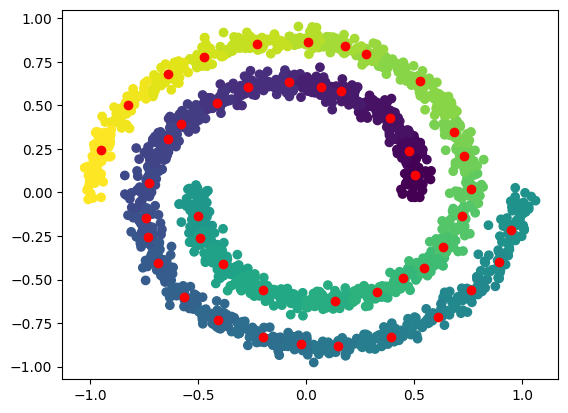

In [29]:
# plot final_clustering 
plt.scatter(noise_free_data[:,0],noise_free_data[:,1],c=C)
plt.scatter(noise_free_data[:,0][center_of_cluster],noise_free_data[:,1][center_of_cluster],c= 'red')
plt.show()

## alghoritm two

NIC

In [30]:
#count number of data for each cluster
unique, counts = np.unique(C, return_counts=True)
NIC = dict(zip(unique, counts))
NIC

{0: 56,
 1: 43,
 2: 76,
 3: 38,
 4: 49,
 5: 8,
 6: 70,
 7: 34,
 8: 38,
 9: 57,
 10: 50,
 11: 31,
 12: 15,
 13: 49,
 14: 34,
 15: 36,
 16: 44,
 17: 28,
 18: 38,
 19: 44,
 20: 33,
 21: 47,
 22: 28,
 23: 54,
 24: 66,
 25: 38,
 26: 55,
 27: 89,
 28: 54,
 29: 38,
 30: 47,
 31: 31,
 32: 30,
 33: 38,
 34: 39,
 35: 33,
 36: 33,
 37: 89,
 38: 22,
 39: 34,
 40: 28,
 41: 55,
 42: 33,
 43: 41,
 44: 45,
 45: 62}

NID

In [31]:
#count the number of data that are in distance of dc distance from center_of_cluster
def count_in_dc(d_matrix_denoise, center_of_cluster, dc):    
    number_of_each_class = {}
    k = 0
    for i in center_of_cluster:
        number_of_each_class[k] = 0
        for j in range(0, len(d_matrix_denoise)):
            if d_matrix_denoise[i][j] < dc:
                number_of_each_class[k] += 1
        k+=1
    return number_of_each_class

NID = count_in_dc(d_matrix_denoise, center_of_cluster, dc)
NID

{0: 40,
 1: 47,
 2: 41,
 3: 37,
 4: 37,
 5: 33,
 6: 36,
 7: 32,
 8: 35,
 9: 33,
 10: 29,
 11: 27,
 12: 25,
 13: 31,
 14: 29,
 15: 28,
 16: 26,
 17: 26,
 18: 30,
 19: 26,
 20: 25,
 21: 29,
 22: 23,
 23: 25,
 24: 40,
 25: 39,
 26: 37,
 27: 37,
 28: 34,
 29: 34,
 30: 36,
 31: 34,
 32: 31,
 33: 27,
 34: 34,
 35: 28,
 36: 27,
 37: 28,
 38: 27,
 39: 27,
 40: 24,
 41: 25,
 42: 27,
 43: 26,
 44: 26,
 45: 29}

NIC < 0.5 * NID

In [32]:
false_labels = [key for key in NIC if NIC[key] < 0.5 * NID[key]]
print(false_labels)

[5]


In [33]:
center_of_cluster

[57,
 71,
 124,
 202,
 227,
 280,
 337,
 363,
 399,
 410,
 484,
 515,
 560,
 578,
 636,
 671,
 704,
 749,
 777,
 822,
 868,
 900,
 935,
 959,
 1039,
 1072,
 1138,
 1202,
 1287,
 1336,
 1371,
 1400,
 1428,
 1468,
 1498,
 1540,
 1571,
 1644,
 1701,
 1714,
 1753,
 1790,
 1831,
 1880,
 1917,
 1960]

In [34]:
indices = center_of_cluster
labels = list(range(len(indices)))

first_C = [-1] * len(noise_free_RNN)
for idx, label in zip(indices, labels):
    first_C[idx] = label

In [35]:
center_of_cluster ,false_labels

([57,
  71,
  124,
  202,
  227,
  280,
  337,
  363,
  399,
  410,
  484,
  515,
  560,
  578,
  636,
  671,
  704,
  749,
  777,
  822,
  868,
  900,
  935,
  959,
  1039,
  1072,
  1138,
  1202,
  1287,
  1336,
  1371,
  1400,
  1428,
  1468,
  1498,
  1540,
  1571,
  1644,
  1701,
  1714,
  1753,
  1790,
  1831,
  1880,
  1917,
  1960],
 [5])

In [36]:
false_labels

[5]

[57, 71, 124, 202, 227, 337, 363, 399, 410, 484, 515, 560, 578, 636, 671, 704, 749, 777, 822, 868, 900, 935, 959, 1039, 1072, 1138, 1202, 1287, 1336, 1371, 1400, 1428, 1468, 1498, 1540, 1571, 1644, 1701, 1714, 1753, 1790, 1831, 1880, 1917, 1960]
[57, 71, 124, 202, 227, 337, 363, 399, 410, 484, 515, 560, 578, 636, 671, 704, 749, 777, 822, 868, 900, 935, 959, 1039, 1072, 1138, 1202, 1287, 1336, 1371, 1400, 1428, 1468, 1498, 1540, 1571, 1644, 1701, 1714, 1753, 1790, 1831, 1880, 1917, 1960]


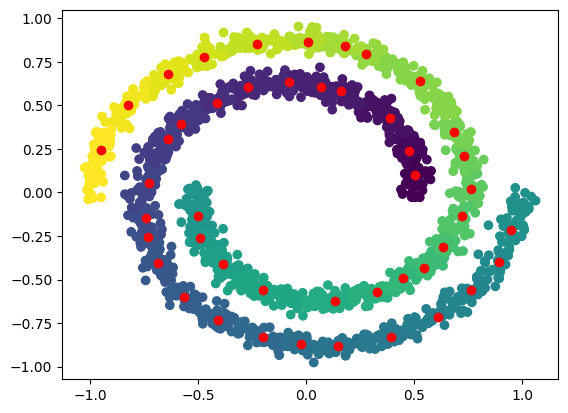

In [37]:
def again_clustring(d_matrix_denoise, center_of_cluster, false_labels):    
    if len(false_labels) != 0:

        #for i in false_labels:
            #center_of_cluster.remove(center_of_cluster[i])
        center_of_cluster = [c for i, c in enumerate(center_of_cluster) if i not in false_labels]

        center_of_cluster_temp = center_of_cluster.copy()
        print(center_of_cluster_temp)
        indices = center_of_cluster
        print(center_of_cluster)
        labels = list(range(len(indices)))
        C = [-1] * len(noise_free_RNN)
        for idx, label in zip(indices, labels):
            C[idx] = label
        for densi in soretd_index_noise_free_density:
            
            if C[densi] == -1 :
                #calculate distance of densi from each center of cluster
                distance_from_center = []
                for center in center_of_cluster_temp:
                    distance_from_center.append(d_matrix_denoise[center][densi])
                #find the minimum distance
                min_distance = np.min(distance_from_center)
                #find the index of minimum distance
                index_of_min_distance = np.argmin(distance_from_center)
                #find the index of center of cluster
                index_of_center_of_cluster = center_of_cluster_temp[index_of_min_distance]
                C[densi] = C[index_of_center_of_cluster]
                center_of_cluster_temp.append(densi)
    return C

new_C = again_clustring( d_matrix_denoise, center_of_cluster ,false_labels)
plt.scatter(noise_free_data[:,0],noise_free_data[:,1],c = new_C)
plt.scatter(noise_free_data[:,0][center_of_cluster],noise_free_data[:,1][center_of_cluster],c= 'red')
plt.show()

## algorithm 3

In [38]:
r = find_dc(noise_free_data)
r

C:\Users\moham\AppData\Local\Temp\ipykernel_10840\2156294850.py:8: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for j, column in row.iteritems():


0.07388514630746729

In [39]:
d_matrix_denoise =np.array(d_matrix_denoise)
new_C = np.array(new_C)

In [40]:
#distance between two cluster according to min distance of two data
def distance_cluster(m,n):
    min_distance = np.inf
    min_i , min_j = 0,0
    for i in range(0, len(d_matrix_denoise)):
        for j in range(0, len(d_matrix_denoise)):
            if new_C[i] == m and new_C[j] == n:
                if d_matrix_denoise[i][j] < min_distance:
                    min_distance = d_matrix_denoise[i][j]
                    min_i = i
                    min_j = j
    return   min_i , min_j

distance_cluster(0,1)

(44, 58)

boundary points

In [41]:
# calculate average desity for each clusters
def average_density_cluster(new_C, noise_free_density):
    average_density = {}
    for i in range(0, len(new_C)):
        if new_C[i] not in average_density.keys():
            average_density[new_C[i]] = noise_free_density[i]
        else:
            average_density[new_C[i]] += noise_free_density[i]
    for key in average_density.keys():
        average_density[key] = average_density[key] / NIC[key]
    return average_density
average_density = average_density_cluster(new_C, noise_free_density)
average_density = sorted(average_density.items(), key=lambda x: x[0])
average_density

[(0, 19.77892981596431),
 (1, 20.727764350940056),
 (2, 19.148075524767965),
 (3, 19.558895017543733),
 (4, 20.890398675784716),
 (5, 137.23436745149263),
 (6, 8.177034718742012),
 (7, 17.756703141220406),
 (8, 23.090747556152024),
 (9, 12.38604565745261),
 (10, 8.303196978032284),
 (11, 6.447823602035201),
 (12, 49.79352595211723),
 (13, 8.825226511425893),
 (14, 14.431421939026913),
 (15, 15.633773142721468),
 (16, 8.250336150037084),
 (17, 20.36138418624128),
 (18, 14.245640696751991),
 (19, 9.55392859212206),
 (20, 17.466989075905808),
 (21, 5.987459299073105),
 (22, 21.253325397628895),
 (23, 22.95495128990606),
 (24, 11.630283123455571),
 (25, 26.768312405870926),
 (26, 30.420560932424618),
 (27, 10.405143600821875),
 (28, 11.900907747113376),
 (29, 23.718996117581987),
 (30, 11.139101606348994),
 (31, 15.494542567306663),
 (32, 17.42587143172393),
 (33, 16.27921193914515),
 (34, 11.79411158751741),
 (35, 13.850358341470422),
 (36, 36.66781931605928),
 (37, 3.241235904695645),
 (

In [42]:
#find boundary points that have lower desity than average density of their cluster
def boundary_points(average_density, new_C, noise_free_density):
    boundary_points = []
    for i in range(0, len(new_C)):
        if noise_free_density[i] < average_density[new_C[i]][1]:
            boundary_points.append(i)
    return boundary_points
boundary_points = boundary_points(average_density, new_C, noise_free_density)
boundary_points

[0,
 1,
 2,
 4,
 5,
 6,
 8,
 11,
 15,
 16,
 20,
 23,
 30,
 31,
 32,
 35,
 36,
 46,
 47,
 48,
 52,
 56,
 59,
 61,
 67,
 69,
 70,
 73,
 74,
 75,
 80,
 85,
 86,
 87,
 89,
 92,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 103,
 104,
 105,
 107,
 109,
 113,
 120,
 122,
 131,
 132,
 137,
 140,
 142,
 146,
 149,
 154,
 157,
 160,
 161,
 162,
 165,
 167,
 168,
 169,
 170,
 172,
 173,
 174,
 175,
 177,
 178,
 179,
 181,
 188,
 190,
 194,
 196,
 198,
 199,
 200,
 204,
 208,
 210,
 213,
 215,
 226,
 229,
 230,
 233,
 234,
 235,
 237,
 239,
 240,
 241,
 242,
 243,
 244,
 245,
 246,
 247,
 248,
 251,
 252,
 253,
 254,
 255,
 256,
 257,
 258,
 259,
 260,
 261,
 262,
 263,
 264,
 265,
 266,
 267,
 268,
 269,
 270,
 271,
 272,
 273,
 274,
 275,
 276,
 277,
 278,
 279,
 280,
 281,
 282,
 283,
 284,
 285,
 286,
 287,
 288,
 289,
 290,
 291,
 292,
 293,
 294,
 295,
 296,
 297,
 298,
 299,
 300,
 301,
 302,
 303,
 304,
 305,
 306,
 307,
 308,
 309,
 310,
 311,
 312,
 313,
 314,
 315,
 316,
 317,
 318,
 319,
 320

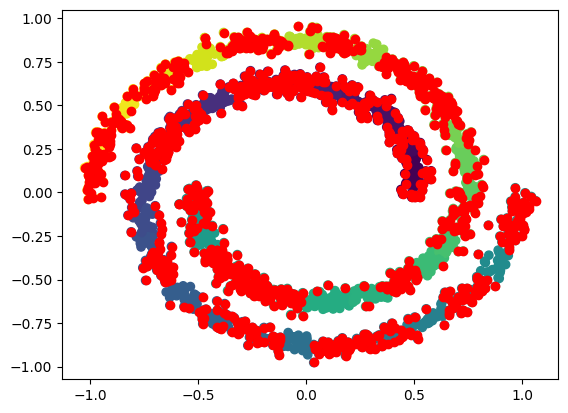

In [43]:
#plot boundary_points and data
plt.scatter(noise_free_data[:,0],noise_free_data[:,1],c=new_C)
plt.scatter(noise_free_data[:,0][boundary_points],noise_free_data[:,1][boundary_points],c= 'red')
plt.show()

merging two cluster

In [44]:
#take label of two cluster and merge them to one cluster 
def merge_cluster(m,n):
    global new_C ,center_of_cluster
    for i in range(0, len(new_C)):
        if new_C[i] == n:
           new_C[i] = m
            #new center
    center_of_cluster[n] = center_of_cluster[m]  

In [45]:
def final_clustering(new_C, center_of_cluster, r, boundary_points):
    counter = 0
    for m in range(0, len(center_of_cluster)):
        for n in range(m+1, len(center_of_cluster)):
            if np.sum(new_C == m) != 0 and np.sum(new_C == n) != 0:
                min_i , min_j = distance_cluster(m, n)
                if  d_matrix_denoise[min_i][min_j] < r:
                    if min_i not in boundary_points and min_j not in boundary_points:
                        merge_cluster(m, n)
                        counter += 1
                    if density[min_i] + density[min_j]  > (density[center_of_cluster[m]] + density[center_of_cluster[n]])/2:
                        merge_cluster(m, n)
                        counter +=1
    return counter
#final_clustering(C, center_of_cluster, r, boundary_points)

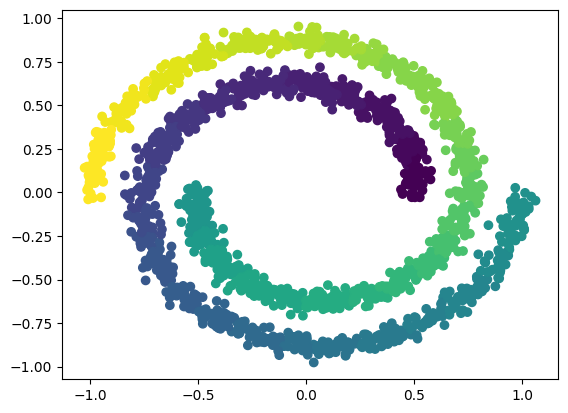

In [46]:
plt.scatter(noise_free_data[:,0],noise_free_data[:,1],c=new_C)
plt.show()

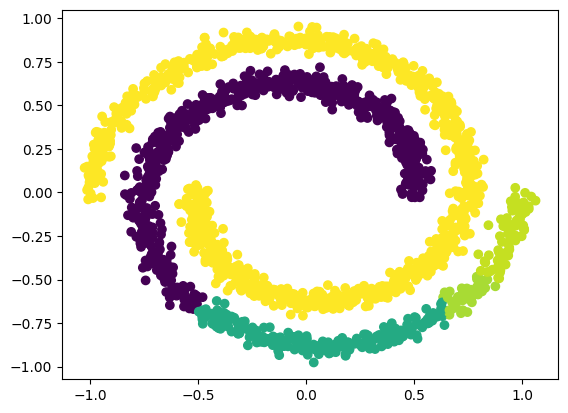

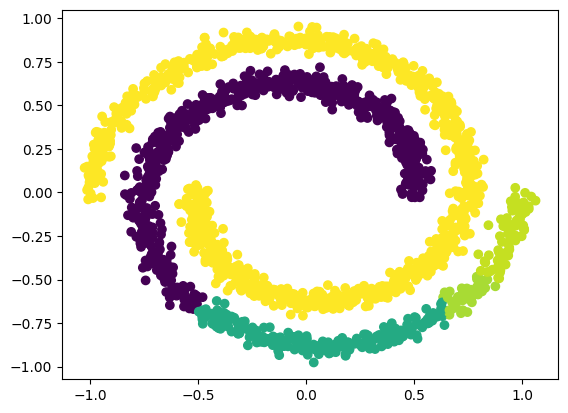

In [47]:
counter  = 1
while  counter!=0:
    counter = final_clustering(new_C, center_of_cluster, r, boundary_points)
    plt.scatter(noise_free_data[:,0],noise_free_data[:,1],c=new_C)
    plt.show()  

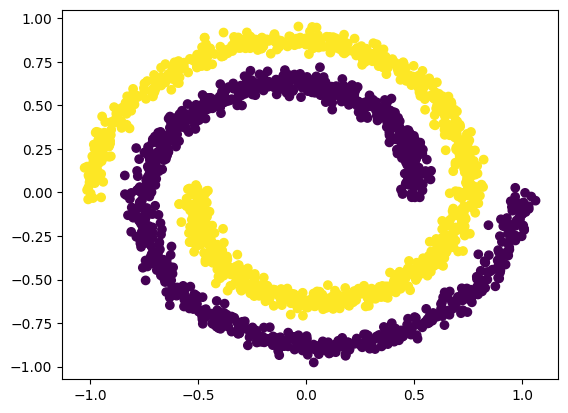

In [58]:
plt.scatter(noise_free_data[:,0],noise_free_data[:,1],c=new_C)
plt.show() 

In [48]:
# unique number in C
unique, counts = np.unique(new_C, return_counts=True)
dict(zip(unique, counts)) ,new_C , labels_free

({0: 648, 14: 223, 20: 47, 21: 82, 23: 1000},
 array([ 0,  0,  0, ..., 23, 23, 23]),
 array([0., 0., 0., ..., 1., 1., 1.]))

In [50]:
#labels of new_C according to real label
for i in np.unique(new_C):
    new_C[new_C == i] = np.unique(labels_free[new_C == i], return_counts=True)[0][0]

In [51]:
from sklearn.metrics import accuracy_score, recall_score, normalized_mutual_info_score
accuracy = accuracy_score(new_C, labels_free)
recall = recall_score(new_C, labels_free, average='weighted')
nmi = normalized_mutual_info_score(new_C, labels_free)
print(f'accuracy is : {accuracy} , and recall is : {recall} ,and nmi is : {nmi} ')

accuracy is : 1.0 , and recall is : 1.0 ,and nmi is : 1.0 
